<a href="https://colab.research.google.com/github/JuanZapa7a/AINavalEngineering/blob/main/Prac_03_Plotting_and_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

© Robert Johansson 2019

R. Johansson, Numerical Python, https://doi.org/10.1007/978-1-4842-4246-9_4

[GitHub](https://github.com/Apress/numerical-python)


# Plotting and Visualization

Visualization is a universal tool for investigating and communicating results of
computational studies, and it is hardly an exaggeration to say that the end
product of nearly all computations – be it numeric or symbolic – is a plot or a
graph of some sort.  It is when visualized in graphical form that knowledge and
insights can be most easily gained from computational results. Visualization is
therefore a tremendously important part of the workflow in all fields of
computational studies.

In the scientific computing environment for Python, there are a number of high-
quality visualization libraries. The most popular general-purpose visualization
library is [Matplotlib](https://matplotlib.org/), which mainly focuses on
generating static publication-quality 2D and 3D graphs. Many other libraries
focus on niche areas of visualization. A few prominent examples are
[Bokeh](http://bokeh.pydata.org) and [Plotly](http://plot.ly), which both
primarily focus on interactivity and web connectivity, [Seaborn]
(http://stanford.edu/~mwaskom/software/seaborn) which is a high-level plotting
library which targets statistical data analysis and which is based on the
Matplotlib library, and the [Mayavi
library](http://docs.enthought.com/mayavi/mayavi) for high-quality 3D
visualization, which uses the venerable [VTK software](http://www.vtk.org) for
heavy-duty scientific visualization. It is also worth noting that other
VTK-based visualization software, such as ParaView (www.paraview.org), is
scriptable with Python and can also be controlled from Python applications. In
the 3D visualization space, there are also more recent players, such as
[VisPy](http://vispy.org), which is an OpenGL-based 2D and 3D visualization
library with great interactivity and connectivity with browser-based
environments, such as the Jupyter Notebook.

The visualization landscape in the scientific computing environment for Python
is vibrant and diverse, and it provides ample options for various visualization
needs. In this chapter we focus on exploring traditional scientific
visualization in Python using the Matplotlib library. With traditional
visualization, I mean plots and figures that are commonly used to visualize
results and data in scientific and technical disciplines, such as line plots,
bar plots, contour plots, colormap plots, and 3D surface plots.

> **Matplotlib** Matplotlib is a Python library for publication-quality 2D and 3D
> graphics, with support for a variety of different output formats. At the time of
> writing, the latest version is 2.2.2. More information about Matplotlib is available
> at the project’s [web site](www.matplotlib.org). This web site contains detailed
> documentation and an extensive gallery that showcases the various types of
> graphs that can be generated using the Matplotlib library, together with the code
> for each example. This gallery is a great source of inspiration for visualization
> ideas, and I highly recommend exploring Matplotlib by browsing this gallery.

There are two common approaches to creating scientific visualizations: using a
graphical user interface to manually build up graphs and using a programmatic
approach where the graphs are created with code. Both approaches have their
advantages and disadvantages. In this chapter we will take the programmatic
approach, and we will explore how to use the Matplotlib API to create graphs and
control every aspect of their appearance. The programmatic approach is a
particularly suitable method for creating graphics for scientific and technical
applications and in particular for creating publication-quality figures. An
important part of the motivation for this is that programmatically created
graphics can guarantee consistency across multiple figures, can be made
reproducible, and can easily be revised and adjusted without having to redo
potentially lengthy and tedious procedures in a graphical user interface.

## Importing Modules

Unlike most Python libraries, Matplotlib actually provides multiple entry points into the
library, with different application programming interfaces (APIs). Specifically, it provides
a stateful API and an object-oriented API, both provided by the module `matplotlib`.
pyplot. I strongly recommend to only use the object-oriented approach, and the
remainder of this chapter will solely focus on this part of Matplotlib.

To use the object-oriented Matplotlib API, we first need to import its Python
modules. In the following we will assume that Matplotlib is imported using the
following standard convention:

In [ ]:
%pip install --upgrade pip
%pip install matplotlib
%pip install sympy
%pip install numpy

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.axes3d import Axes3D

The first line is assuming that we are working in an IPython environment and
more specifically in the Jupyter Notebook or the IPython QtConsole. The IPython
magic command `%matplotlib inline` configures the Matplotlib to use the “inline”
backend, which results in the created figures being displayed directly in, for
example, the Jupyter Notebook, rather than in a new window. The statement `import
matplotlib as mpl` imports the main Matplotlib module, and the import statement
`import matplotlib.pyplot as plt`, is for convenient access to the submodule
matplotlib.pyplot that provides the functions that we will use to create new
Figure instances.

Throughout this chapter we also make frequent use of the NumPy library, and as
in Chapter 2, we assume that NumPy is imported using

In [ ]:
import numpy as np

and we also use the SymPy library, imported as:

In [ ]:
import sympy

##  Getting Started

Before we delve deeper into the details of how to create graphics with
Matplotlib, we begin here with a quick example of how to create a simple but
typical graph. We also cover some of the fundamental principles of the
Matplotlib library, to build up an understanding for how graphics can be
produced with the library.  

A graph in Matplotlib is structured in terms of a
`Figure` instance and one or more Axes instances within the figure. The Figure
instance provides a canvas area for drawing, and the Axes instances provide
coordinate systems that are assigned to fixed regions of the total figure
canvas; see Figure 4-1.



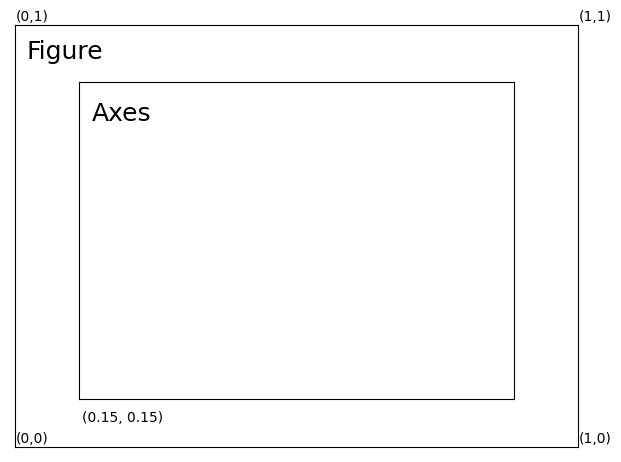

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig = plt.figure()

ax = fig.add_axes([0.05, 0.05, .88, .88])
ax.set_yticks([])
ax.set_xticks([])
ax.text(0.001, 0.01, "(0,0)")
ax.text(1.001, 0.01, "(1,0)")
ax.text(0.001, 1.01, "(0,1)")
ax.text(1.001, 1.01, "(1,1)")
ax.text(0.02, 0.92, "Figure", fontsize=18)

ax.text(0.12, 0.06, "(0.15, 0.15)")

ax = fig.add_axes([0.15, 0.15, 0.68, 0.66])
ax.text(0.03, 0.88, "Axes", fontsize=18)
ax.set_yticks([])
ax.set_xticks([])


fig.savefig("images/figure-axes-schematic.pdf");

_**Figure 4-1**_. *Illustration of the arrangement of a Matplotlib Figure instance and an Axes instance. The Axes instance provides a coordinate system for plotting, and the Axes instance itself is assigned to a region within the figure canvas. The figure canvas has a simple coordinate system where (0, 0) is the lower-left corner and (1,1) is the upper-right corner. This coordinate system is only used when placing elements, such as an Axes, directly on the figure canvas.*


A `Figure` can contain multiple `axes` instances, for example, to show multiple
panels in a figure or to show insets within another gc instance. An `axes`
instance can manually be assigned to an arbitrary region of a figure canvas, or,
alternatively, gc instances can be automatically added to a figure canvas
using one of several layout managers provided by Matplotlib. The `axes` instance
provides a coordinate system that can be used to plot data in a variety of plot
styles, including line graphs, scatter plots, bar plots, and many other styles.
In addition, the `axes` instance also determines how the coordinate `axes` are
displayed, for example, with respect to the axis labels, ticks and tick labels,
and so on.  In fact, when working with Matplotlib’s object-oriented API, most
functions that are needed to tune the appearance of a graph are methods of the
`axes` class.

As a simple example for getting started with Matplotlib, say that we would like
to graph the function $y(x) = x^3+5x^2+10$, together with its first and second
derivatives, over the range $x ∈ [−5, 2]$. To do this we first create NumPy
arrays for the x range and then compute the three functions we want to graph.
When the data for the graph is prepared, we need to create Matplotlib `Figure` and
`axes` instances, then use the `plot` method of the `axes` instance to plot the data,
and set basic graph properties such as x and y axes labels,  using the
set_xlabel and set_ylabel methods and generating a legend using the legend
method. These steps are carried out in the following code, and the resulting
graph is shown in Figure 4-2.

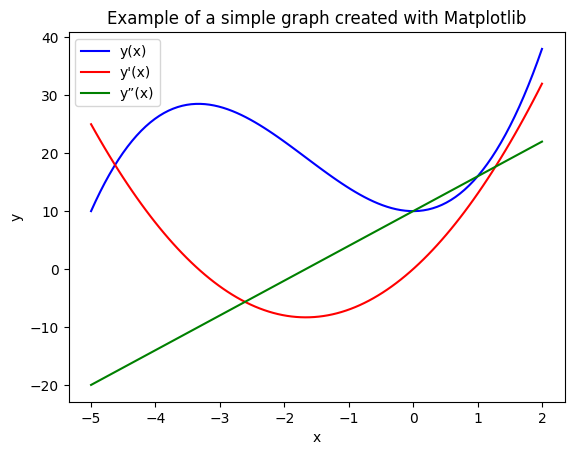

In [ ]:
x = np.linspace(-5, 2, 100)
y1 = x**3 + 5*x**2 + 10
y2 = 3*x**2 + 10*x
y3 = 6*x + 10

fig, ax = plt.subplots()
ax.set_title('Example of a simple graph created with Matplotlib')
ax.plot(x, y1, color="blue", label="y(x)")
ax.plot(x, y2, color="red", label="y'(x)")
ax.plot(x, y3, color="green", label="y”(x)")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.legend()

_**Figure 4-2**. Example of a simple graph created with Matplotlib_

Here we used the `plt.subplots` function to generate `Figure` and `Axes` instances.
This function can be used to create grids of `Axes` instances within a newly
created `Figure` instance, but here it was merely used as a convenient way of
creating a `Figure` and an `Axes` instance in one function call. Once the `Axes`
instance is available, note that all the remaining steps involve calling methods
of this `Axes` instance. To create the actual graphs, we use `ax.plot`, which takes
as first and second arguments NumPy arrays with numerical data for the x and y
values of the graph, and it draws a line connecting these data points. We also
used the optional color and label keyword arguments to specify the color of each
line and assign a text label to each line that is used in the legend.

These few lines of code are enough to generate the graph we set out to produce,
but as a bare minimum, we should also set labels on the x and y axes and if
suitable add a legend for the curves we have plotted. The axis labels are set
with `ax.set_xlabel` and `ax.set_ylabel` methods, which takes as argument a text
string with the corresponding label. The legend is added using the ax.legend
method, which does not require any arguments in this case since we used the
label keyword argument when plotting the curves.  

These are the typical steps required to create a graph using Matplotlib. While
this graph, Figure 4-2, is complete and fully functional, there is certainly
room for improvements in many aspects of its appearance. For example, to meet
publication or production standards, we may need to change the font and the
fontsize of the axis labels, the tick labels, and the legend, and we should
probably move the legend to a part of the graph where it does not interfere with
the curves we are plotting.  We might even want to change the number of axis
ticks and label and add annotations and additional help lines to emphasize
certain aspects of the graph and so on. With a few changes along these lines,
the figure may, for example, appear like in Figure 4-3, which is considerably
more presentable. In the remainder of this chapter, we look at how to fully
control the appearance of the graphics produced using Matplotlib.


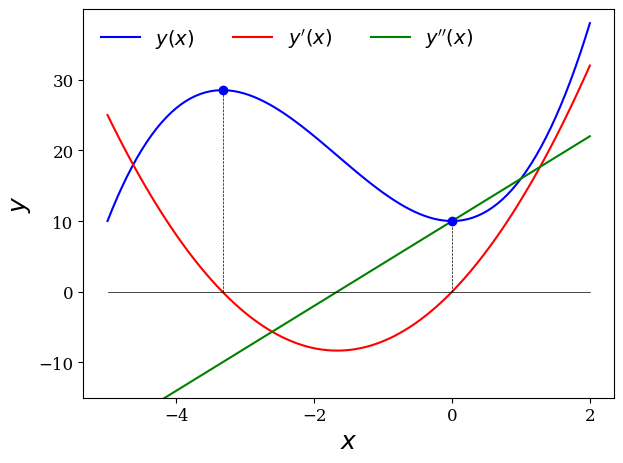

In [ ]:
mpl.rcParams["font.family"] = "serif"
mpl.rcParams["font.size"] = "12"

fig, ax = plt.subplots()

ax.plot(x, y1, lw=1.5, color="blue", label=r"$y(x)$")
ax.plot(x, y2, lw=1.5, color="red", label=r"$y'(x)$")
ax.plot(x, y3, lw=1.5, color="green", label=r"$y''(x)$")

ax.plot(x, np.zeros_like(x), lw=0.5, color="black")
ax.plot([-3.33, -3.33], [0, (-3.3)**3 + 5*(-3.3)**2 + 10], ls='--', lw=0.5,color="black")
ax.plot([0, 0], [0, 10], lw=0.5, ls='--', color="black")
ax.plot([0], [10], lw=0.5, marker='o', color="blue")
ax.plot([-3.33], [(-3.3)**3 + 5*(-3.3)**2 + 10], lw=0.5, marker='o', color="blue")

ax.set_ylim(-15, 40)
ax.set_yticks([-10, 0, 10, 20, 30])
ax.set_xticks([-4, -2, 0, 2])

ax.set_xlabel("$x$", fontsize=18)
ax.set_ylabel("$y$", fontsize=18)
ax.legend(loc=0, ncol=3, fontsize=14, frameon=False)

fig.tight_layout();

fig.savefig("images/ch4-figure-2.pdf")

mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.size"] = "10"



##  Interactive and Noninteractive Modes

The Matplotlib library is designed to work well with many different environments and
platforms. As such, the library does not only contain routines for generating graphs, but
it also contains support for displaying graphs in different graphical environments. To
this end, Matplotlib provides backends for generating graphics in different formats (e.g.,
PNG, PDF, Postscript, and SVG) and for displaying graphics in a graphical user interface
using a variety of different widget toolkits (e.g., Qt, GTK, wxWidgets, and Cocoa for Mac
OS X) that are suitable for different platforms.

Which backend to use can be selected in that Matplotlib resource file (The Matplotlib resource file, `matplotlibrc`, can be used to set default values of many Matplotlib parameters, including which backend to use. The location of the file is platform dependent. For details, [see](http://matplotlib.org/users/customizing.html).) or using the
function mpl.use, which must be called right after importing matplotlib, before importing
the matplotlib.pyplot module. For example, to select the Qt4Agg backend, we can use

In [ ]:
import matplotlib as mpl
mpl.use('webagg')
import matplotlib.pyplot as plt

![Fig4-4](images/fig4-4.png)

_**Figure 4-4**. A screenshot of the Matplotlib graphical user interface for
displaying figures, using the Qt4 backend on Mac OS X. The detailed appearance
varies across platforms and backends, but the basic functionality is the same._

The graphical user interface for displaying Matplotlib figures, as shown in
Figure 4- 4,  is useful for interactive use with Python script files or the
IPython console, and it allows to interactively explore figures, for example, by
zooming and panning. When using an interactive backend, which displays the
figure in a graphical user interface, it is necessary to call the function
plt.show to get the window to appear on the screen.  By default, the `plt.show`
call will hang until the window is closed. For a more interactive experience, we
can activate interactive mode by calling the function `plt.ion`. This instructs
Matplotlib to take over the GUI event loop and show a window for a figure as
soon as it is created, returning the control flow to the Python or IPython
interpreter. To have the changes to a figure take effect, we need to issue a
redraw command using the function `plt.draw`. We can deactivate the interactive
mode using the function `plt.ioff`, and we can use the function `mpl.is_interactive`
to check if Matplotlib is in interactive or noninteractive mode.

While the interactive graphical user interfaces have unique advantages, when
working the Jupyter Notebook or Qtconsole, it is often more convenient to
display Matplotlib-produced graphics embedded directly in the notebook. This
behavior is activated using the IPython command `%matplotlib inlin`, which
activates the “inline backend” provided by IPython. This configures Matplotlib
to use a noninteractive backend to generate graphics images, which are then
displayed as static images in, for example, the Jupyter Notebook. The IPython
“inline backend” for Matplotlib can be fine-tuned using the IPython `%config`
command. For example, we can select the output format for the generated graphics
using the `InlineBackend.figure_format option` (For Max OS X users, `%config
InlineBackend.figure_format='retina'` is another useful option, which improves
the quality of the Matplotlib graphics when viewed on retina displays.  ) which,
for example, we can set to ‘svg’ to generate SVG graphics rather than PNG files:

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format='svg'


With this approach the interactive aspect of the graphical user interface is lost
(e.g., zooming and panning), but embedding the graphics directly in the notebook has
many other advantages. For example, keeping the code that was used to generate a
figure together with the resulting figure in the same document eliminates the need for
rerunning the code to display a figure, and interactive nature of the Jupyter Notebook
itself replaces some of the interactivity of Matplotlib’s graphical user interface.

When using the IPython inline backend, it is not necessary to use `plt.show` and
`plt.draw`, since the IPython rich display system is responsible for triggering
the rendering and the displaying of the figures. In this book, I will assume
that code examples are executed in the Jupyter Notebooks, and the calls to the
function `plt.show` are therefore not in the code examples. When using an
interactive backend, it is necessary to add this function call at the end of each example.

## `Figure`

As introduced in the previous section, the `Figure` object is used in Matplotlib to
represent a graph. In addition to providing a canvas on which, for example, `Axes`
instances can be placed, the `Figure` object also provides methods for performing actions
on figures, and it has several attributes that can be used to configure the properties of a
figure.

A `Figure` object can be created using the function `plt.figure`, which takes several
optional keyword arguments for setting figure properties. In particular, it accepts the
`figsize` keyword argument, which should be assigned to a tuple on the form (width,
height), specifying the width and height of the figure canvas in inches. It can also
be useful to specify the color of the figure canvas by setting the `facecolor` keyword
argument.

Once a `Figure` is created, we can use the `add.axes` method to create a new `Axes`
instance and assign it to a region on the figure canvas. The `add.axes` takes one
mandatory argument: a list containing the coordinates of the lower-left corner
and the width and height of the `Axes` in the figure canvas coordinate system, on
the format (`left`, `bottom`, `width`, `height`) (An alternative to passing a
coordinate and size tuple to `add.axes` is to pass an already existing `Axes`
instance.) The coordinates and the width and height of the `Axes` object are
expressed as fractions of total canvas width and height; see Figure 4-1.  For
example, an `Axes` object that completely fills the canvas corresponds to (0, 0,
1, 1),  but this leaves no space for axis labels and ticks. A more practical
size could be (0.1, 0.1, 0.8, 0.8), which corresponds to a centered `Axes`
instance that covers 80% of the width and height of the canvas. The `add.axes`
method takes a large number of keyword arguments for setting properties of the
new `Axes` instance. These will be described in more detail later in this chapter,
when we discuss the `Axes` object in depth. However, one keyword argument that is
worth to emphasize here is `facecolor`, with which we can assign a background
color for the `Axes` object. Together with the `facecolor` argument of `plt.figure`,
this allows selecting colors of both the canvas and the regions covered by `Axes`
instances.

With the `Figure` and `Axes` objects obtained from `plt.figure` and `fig.add.axes`, we
have the necessary preparations to start plotting data using the methods of the
`Axes` objects. For more details on this, see the next section of this chapter.
However, once the required plots have been created, there are more methods in
the `Figure` objects that are important in the graph creation workflow. For
example, to set an overall figure title, we can use suptitle, which takes a
string with the title as argument. To save a figure to a file, we can use the
savefig method. This method takes a string with the output filename as first
argument, as well as several optional keyword arguments. By default, the output
file format will be determined from the file extension of the filename argument,
but we can also specify the format explicitly using the format argument. The
available output formats depend on which Matplotlib backend is used, but
commonly available options are PNG, PDF, EPS, and SVG formats. The resolution of
the generated image can be set with the dpi argument. DPI stands for “dots per
inch,” and since the figure size is specified in inches using the figsize
argument, multiplying these numbers gives the output image size in pixels. For
example, with figsize=(8, 6) and dpi=100, the size of the generated image is
800x600 pixels. The savefig method also takes some arguments that are similar to
those of the `plt.figure` function, such as the facecolor argument.  Note that
even though the facecolor argument is used with `plt.figure`, it also needs to be
specified with savefig for it to apply to the generated image file. Finally, the
figure canvas can also be made transparent using the transparent=True argument
to savefig. The following code listing illustrates these techniques, and the
result is shown in Figure 4-5.

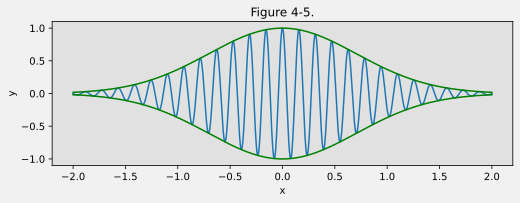

In [ ]:
fig = plt.figure(figsize=(8, 2.5), facecolor="#f1f1f1")

# axes coordinates as fractions of the canvas width and height
#left, bottom, width, height = 0.1, 0.1, 0.8, 0.8
coorax = [0.1, 0.1, 0.8, 0.8]
ax = fig.add_axes(coorax, facecolor="#e1e1e1")
#ax = fig.add_axes((left, bottom, width, height), facecolor="#e1e1e1")
x = np.linspace(-2, 2, 1000)
y1 = np.cos(40 * x)

y2 = np.exp(-x**2)

ax.plot(x, y1 * y2)
ax.plot(x, y2 , 'g')
ax.plot(x, -y2 , 'g')
ax.set_xlabel("x")
ax.set_ylabel("y")

#ax.set_title('Figure 4-5')
fig.suptitle('Figure 4-5.')
fig.savefig("images/graph.png", dpi=100, facecolor="#f1f1f1")
fig.savefig("images/graph.pdf", dpi=600, facecolor="#f1f1f1")

_**Figure 4-5**. Graph showing the result of setting the size of a figure with
`figsize`, adding a new Axes instance with add_axes, setting the background
colors of the Figure and Axes objects using facecolor, and finally saving the
figure to file using `savefig`_

## `Axes`

The `Figure` object introduced in the previous section provides the backbone of a
Matplotlib graph, but all the interesting content is organized within or around
`Axes` instances. We have already encountered `Axes` objects on a few occasions
earlier in this chapter. The `Axes` object is central to most plotting activities
with the Matplotlib library.  It provides the coordinate system in which we can
plot data and mathematical functions, and in addition it contains the axis
objects that determine where the axis labels and the axis ticks are placed. The
functions for drawing different types of plots are also methods of this `Axes`
class. In this section we first explore different types of plots that can be
drawn using `Axes` methods and how to customize the appearance of the x and y axes
and the coordinate systems used with an `Axes` object.

We have seen how new `Axes` instances can be added to a figure explicitly using
the `add_axes` method. This is a flexible and powerful method for placing `Axes`
objects at arbitrary positions, which has several important applications, as we
will see later in the chapter. However, for most common use-cases, it is tedious
to specify explicitly the coordinates of the `Axes` instances within the figure
canvas. This is especially true when using multiple panels of `Axes` instances
within a figure, for example, in a grid layout.  Matplotlib provides several
different `Axes` layout managers, which create and place `Axes` instances within a
figure canvas following different strategies. Later in this chapter, we look
into more detail of how to use such layout managers. However, to facilitate the
forthcoming examples, we here briefly look at one of these layout managers: the
`plt.subplots` function. Earlier in this chapter, we already used this function
to conveniently generate new Figure and `Axes` objects in one function call.
However, the `plt.subplots` function is also capable of filling a figure with a
grid of `Axes` instances, which is specified using the first and the second
arguments, or alternatively with the nrows and ncols arguments, which, as the
names imply, create a grid of `Axes` objects, with the given number of rows and
columns. For example, to generate a grid of `Axes` instances in a newly created
Figure object, with three rows and two columns, we can use

```
fig, axes = `plt.subplots`(nrows=3, ncols=2)
```

Here, the function `plt.subplots` returns a tuple (`fig`, `axes`), where `fig`
is a Figure instance and `axes` is a NumPy array of size (`nrows`, `ncols`), in
which each element is an `Axes` instance that has been appropriately placed in
the corresponding figure canvas. At this point we can also specify that columns
and/or rows should share x and y axes, using the `sharex` and `sharey` arguments,
which can be set to `True` or `False`.

The `plt.subplots` function also takes two special keyword arguments `fig_kw`
and `subplot_kw`, which are dictionaries with keyword arguments that are used
when creating the Figure and `Axes` instances, respectively. This allows us to
set and retain full control of the properties of the Figure and `Axes` objects
with `plt.subplots` in a similar way as when directly using `plt.figure` and the
`make_axes` method.

## Plot Types

Effective scientific and technical visualization of data requires a wide variety
of graphing techniques. Matplotlib implements many types of plotting techniques
as methods of the `Axes` object. For example, in the previous examples, we have
already used the `plot` method, which draws curves in the coordinate system
provided by the `Axes` object.

In the following sections, we explore some of Matplotlib’s plotting functions in
more depth by using these functions in example graphs. A summary of commonly
used 2D plot functions is shown in Figure 4-6. Other types of graphs, such as
color maps and 3D graphs, are discussed later in this chapter. All plotting
functions in Matplotlib expect data as NumPy arrays as input, typically as
arrays with x and y coordinates as the first and second arguments. For details,
see the docstrings for each method shown in Figure 4-6, using, for example,
`help(plt.Axes.bar)`.

In [ ]:
help(plt.Axes.bar)

Help on function bar in module matplotlib.axes._axes:

bar(self, x, height, width=0.8, bottom=None, *, align='center', data=None, **kwargs)
    Make a bar plot.
    
    The bars are positioned at *x* with the given *align*\ment. Their
    dimensions are given by *height* and *width*. The vertical baseline
    is *bottom* (default 0).
    
    Many parameters can take either a single value applying to all bars
    or a sequence of values, one for each bar.
    
    Parameters
    ----------
    x : float or array-like
        The x coordinates of the bars. See also *align* for the
        alignment of the bars to the coordinates.
    
    height : float or array-like
        The height(s) of the bars.
    
    width : float or array-like, default: 0.8
        The width(s) of the bars.
    
    bottom : float or array-like, default: 0
        The y coordinate(s) of the bars bases.
    
    align : {'center', 'edge'}, default: 'center'
        Alignment of the bars to the *x* coordinates

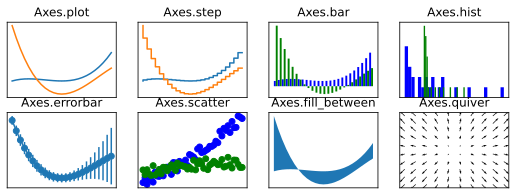

In [ ]:
fignum = 0

def hide_labels(fig, ax):
    global fignum
    ax.set_xticks([])
    ax.set_yticks([])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.axis('tight')

    fignum += 1
    fig.savefig("images/plot-types-%d.pdf" % fignum)

x = np.linspace(-3, 3, 25)
y1 = x**3+ 3 * x**2 + 10
y2 = -1.5 * x**3 + 10*x**2 - 15

fig, ax = plt.subplots(nrows=2,ncols=4,figsize=(9, 3))

ax[0,0].set_title('Axes.plot')
ax[0,0].plot(x, y1)
ax[0,0].plot(x, y2)

ax[0,1].set_title('Axes.step')
ax[0,1].step(x, y1)
ax[0,1].step(x, y2)

width = 6/50.0
ax[0,2].set_title('Axes.bar')
ax[0,2].bar(x - width/2, y1, width=width, color="blue")
ax[0,2].bar(x + width/2, y2, width=width, color="green")

ax[0,3].set_title('Axes.hist')
ax[0,3].hist(y2, bins=30, color="blue")
ax[0,3].hist(y1, bins=30, color="green")

ax[1,0].set_title('Axes.errorbar')
ax[1,0].errorbar(x, y2, yerr=y1, fmt='o-')

ax[1,1].set_title('Axes.scatter')
x1 = np.linspace(0, 5, 50)
ax[1,1].scatter(x1, -1 + x1 + 0.25 * x1**2 + 2 * np.random.rand(len(x1)),color="blue")
ax[1,1].scatter(x1, np.sqrt(x1) + 2 * np.random.rand(len(x1)), color="green")

ax[1,2].set_title('Axes.fill_between')
ax[1,2].fill_between(x, y1, y2)

ax[1,3].set_title('Axes.quiver')

colors = ['yellowgreen', 'gold', 'lightskyblue', 'lightcoral']

xa = ya = np.linspace(-2, 2, 10)
X, Y = np.meshgrid(xa, ya)
U = np.sin(X)
V = np.sin(Y)
ax[1,3].quiver(X, Y, U, V)

for rows in range(2):
    for cols in range(4):
        hide_labels(fig, ax[rows,cols])



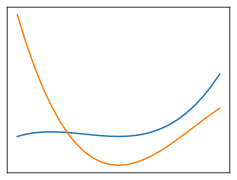

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))

ax.plot(x, y1)
ax.plot(x, y2)

hide_labels(fig, ax)

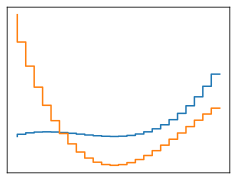

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))

ax.step(x, y1)
ax.step(x, y2)

hide_labels(fig, ax)

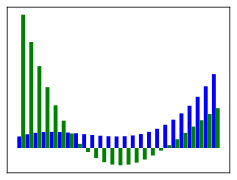

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))
width = 6/50.0
ax.bar(x - width/2, y1, width=width, color="blue")
ax.bar(x + width/2, y2, width=width, color="green")

hide_labels(fig, ax)

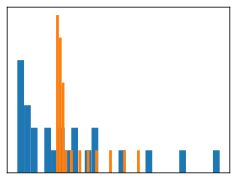

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.hist(y2, bins=30)
ax.hist(y1, bins=30)

hide_labels(fig, ax)

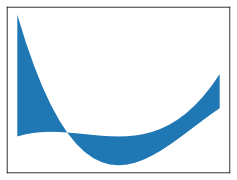

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.fill_between(x, y1, y2)

hide_labels(fig, ax)

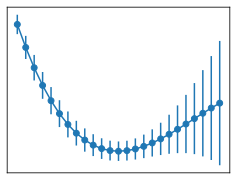

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))

ax.errorbar(x, y2, yerr=y1, fmt='o-')

hide_labels(fig, ax)


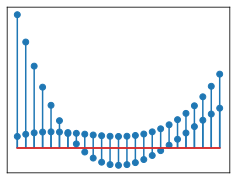

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.set(xlim=(-3, 3), xticks=np.arange(-3, 3),ylim=(-3, 3), yticks=np.arange(-3, 3))
ax.stem(x, y2)
ax.stem(x, y1)

hide_labels(fig, ax)

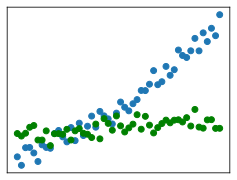

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))

x = np.linspace(0, 5, 50)

ax.scatter(x, -1 + x + 0.25 * x**2 + 2 * np.random.rand(len(x)))
ax.scatter(x, np.sqrt(x) + 2 * np.random.rand(len(x)), color="green")

hide_labels(fig, ax)

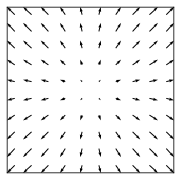

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3))

colors = ['yellowgreen', 'gold', 'lightskyblue', 'lightcoral']

x = y = np.linspace(-2, 2, 10)
X, Y = np.meshgrid(x, y)
U = np.sin(X)
V = np.sin(Y)

ax.quiver(X, Y, U, V)

hide_labels(fig, ax)

Figure 4-6. Overview of selected 2D graph types. The name of the Axes method for generating each type of graph is shown together with the corresponding graph.

## Line Properties

The most basic type of plot is the simple line plot. It may, for example, be
used to depict the graph of a univariate function or to plot data as a function
of a control variable.  In line plots, we frequently need to configure
properties of the lines in the graph, for example, the line width, line color,
and line style (solid, dashed, dotted, etc.). In Matplotlib we set these
properties with keyword arguments to the `plot` methods, such as `plot`, `step`,
and `bar`. A few of these graph types are shown in Figure 4-6. Many of the plot
methods have their own specific arguments, but basic properties such as colors
and line width are shared among most plotting methods. These basic properties
and the corresponding keyword arguments are summarized in Table 4-1.


_**Table 4-1**. Basic Line Properties and Their Corresponding Argument Names for Use with the Matplotlib Plotting Methods_


![tabla](images/table.png)

To illustrate the use of these properties and arguments, consider the following code, which draws horizontal lines with various values of the line width, line style, marker symbol, color, and size. The resulting graph is shown in Figure 4-7.

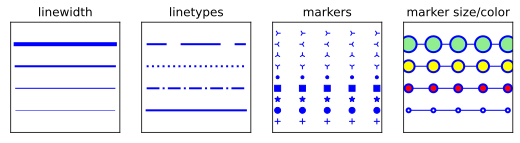

In [ ]:
x = np.linspace(-5, 5, 5)
y = np.ones_like(x)

def axes_settings(fig, ax, title, ymax):
  ax.set_xticks([])
  ax.set_yticks([])
  ax.set_ylim(0, ymax+1)
  ax.set_title(title)

fig, axes = plt.subplots(1, 4, figsize=(9,2))

# Line width
linewidths = [0.5, 1.0, 2.0, 4.0]
for n, linewidth in enumerate(linewidths):
  axes[0].plot(x, y + n, color="blue", linewidth=linewidth)
axes_settings(fig, axes[0], "linewidth", len(linewidths))

# Line style
linestyles = ['-', '-.', ':']
for n, linestyle in enumerate(linestyles):
  axes[1].plot(x, y + n, color="blue", lw=2, linestyle=linestyle)
# custom dash style
line, = axes[1].plot(x, y + 3, color="blue", lw=2)
length1, gap1, length2, gap2 = 10, 7, 20, 7
line.set_dashes([length1, gap1, length2, gap2])
axes_settings(fig, axes[1], "linetypes", len(linestyles) + 1)

# marker types
markers = ['+', 'o', '*', 's', '.', '1', '2', '3', '4']
for n, marker in enumerate(markers):
  # lw = shorthand for linewidth, ls = shorthand for linestyle
  axes[2].plot(x, y + n, color="blue", lw=2, ls='', marker=marker)
axes_settings(fig, axes[2], "markers", len(markers))

# marker size and color
markersizecolors = [(4, "white"), (8, "red"), (12, "yellow"),  (16, "lightgreen")]
for n, (markersize, markerfacecolor) in enumerate (markersizecolors):
  axes[3].plot(x, y + n, color="blue", lw=1, ls='-', marker='o', markersize=markersize,markerfacecolor=markerfacecolor, markeredgewidth=2)
axes_settings(fig, axes[3], "marker size/color", len (markersizecolors))


_**Figure 4-7**. Graphs showing the result of setting the line properties line
width, line style, marker type and marker size, and color_

In practice, using different colors, line widths and line styles are important
tools for making a graph easily readable. In a graph with a large number of
lines, we can use a combination of colors and line style to make each line
uniquely identifiable, for example, via a legend. The line width property is
best used to give emphasis to important lines.  Consider the following example,
where the function $sin(x)$ is plotted together with its first few series
expansions around $x = 0$, as shown in Figure 4-8.

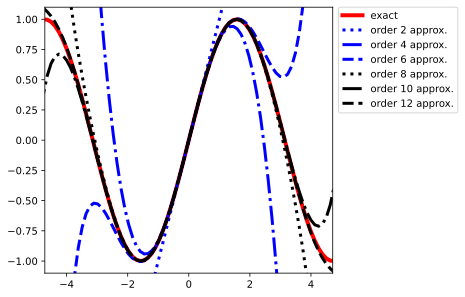

In [ ]:
# a symbolic variable for x, and a numerical array with specific values of x
sym_x = sympy.Symbol("x")
x = np.linspace(-2 * np.pi, 2 * np.pi, 100)

def sin_expansion(x, n):
    """
    Evaluate the nth order Taylor. series expansion
    of sin(x) for the numerical values in the array x.
    """
    return sympy.lambdify(sym_x, sympy.sin(sym_x).series(n=n+1).removeO(), 'numpy')(x)

fig, ax = plt.subplots()

ax.plot(x, np.sin(x), linewidth=4, color="red", label='exact')

colors = ["blue", "black"]
linestyles = [':', '-.', '--']
for idx, n in enumerate(range(1, 12, 2)):
    ax.plot(x, sin_expansion(x, n), color=colors[idx // 3], linestyle=linestyles[idx % 3], linewidth=3,  label="order %d approx." % (n+1))

ax.set_ylim(-1.1, 1.1)
ax.set_xlim(-1.5*np.pi, 1.5*np.pi)

# place a legend outsize of the Axes
ax.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0.0)
# make room for the legend to the right of the Axes
fig.subplots_adjust(right=.75)


**Figure 4-8**. Graph for sin(x) together with its Taylor series approximation of the few lowest orders.

## Legends

A graph with multiple lines may often benefit from a legend, which displays a
label along each line type somewhere within the figure. As we have seen in the
previous example, a legend may be added to an `Axes` instance in a Matplotlib
figure using the legend method. Only lines with assigned labels are included in
the legend (to assign a label to a line, use the label argument of, for example,
`Axes.plot`). The legend method accepts a large number of optional arguments.
See `help(plt.legend)` for details. Here we emphasize a few of the more useful
arguments. In the example in the previous section, we used the loc argument,
which allows to specify where in the Axes area the legend is to be added:
`loc=1` for upper-right corner, `loc=2` for upper-left corner, `loc=3` for the
lower-left corner, and `loc=4` for lower-right corner, as shown in Figure 4-9.

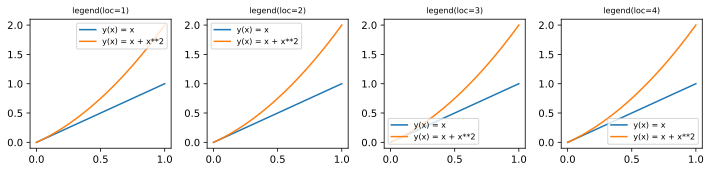

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(10, 2.5))

x = np.linspace(0, 1, 100)

for n in range(4):
    axes[n].plot(x, x, label="y(x) = x")
    axes[n].plot(x, x + x**2, label="y(x) = x + x**2")
    axes[n].legend(loc=n+1,fontsize=8)
    axes[n].set_title("legend(loc=%d)" % (n+1), fontsize=8)

fig.tight_layout()
fig.savefig("images/legend-loc.pdf")


Figure 4-9. Legend at different positions within an Axes instance, specified
using the loc argument of the method legend

In the example of the previous section, we also used the `bbox_to_anchor`, with
which help the legend can be placed at an arbitrary location within the figure
canvas. The `bbox_to_anchor` argument takes the value of a tuple on the form ($x$,
$y$), where x and y are the _canvas coordinates_ within the Axes object. That is,
the point (0, 0) corresponds to the lower-left corner, and (1, 1) corresponds to
the upper-right corner. Note that x and y can be smaller than 0 and larger than
1 in this case, which indicates that the legend is to be placed outside the Axes
area, as was used in the previous section.

By default all lines in the legend are shown in a vertical arrangement. Using
the `ncols` argument, it is possible to split the legend labels into multiple
columns, as illustrated in Figure 4-10.

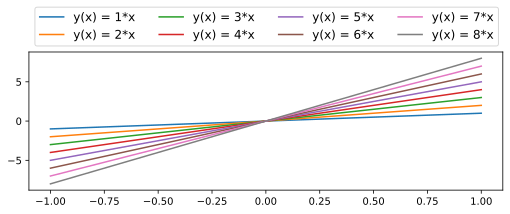

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8.5, 3))

x = np.linspace(-1, 1, 100)

for n in range(1, 9):
    ax.plot(x, n * x, label="y(x) = %d*x" % n)

ax.legend(ncol=4, loc=3, bbox_to_anchor=(0, 1), fontsize=12)
fig.subplots_adjust(top=.75);
fig.savefig("images/legend-loc-2.pdf")

_**Figure 4-10**. Legend displayed outside the Axes object and shown with four
columns instead of the single one, here using ax.legend(ncol=4, loc=3,
bbox_to_anchor=(0, 1))_

## Text Formatting and Annotations

Text labels, titles, and annotations are important components in most graphs,
and having full control of, for example, the font types and fontsizes that are
used to render such texts is a basic requirement for producing
publication-quality graphs. Matplotlib provides several ways of configuring font
properties. The default values can be set in the Matplotlib resource file, and
session-wide configuration can be set in the `mpl.rcParams` dictionary. This
dictionary is a cache of the Matplotlib resource file, and changes to parameters
within this dictionary are valid until the Python interpreter is restarted and
Matplotlib is imported again. Parameters that are relevant to how text is
displayed include, for example, `'font.family'` and `'font.size'`.


---
> **Tip**
>
> Try `print(mpl.rcParams)` to get a list of possible configuration
parameters and their current values. updating a parameter is as simple as
assigning a new value to the corresponding item in the dictionary `mpl.rcParams`,
for example, `mpl.rcParams[‘savefig.dpi’] = 100`. see also the `mpl.rc` function,
which can be used to update the `mpl.rcParams` dictionary, and  `mpl.rcdefaults` for
restoring the default values.  
---

In [ ]:
print(mpl.rcParams)

_internal.classic_mode: False
agg.path.chunksize: 0
animation.bitrate: -1
animation.codec: h264
animation.convert_args: []
animation.convert_path: convert
animation.embed_limit: 20.0
animation.ffmpeg_args: []
animation.ffmpeg_path: ffmpeg
animation.frame_format: png
animation.html: none
animation.writer: ffmpeg
axes.autolimit_mode: data
axes.axisbelow: line
axes.edgecolor: black
axes.facecolor: white
axes.formatter.limits: [-5, 6]
axes.formatter.min_exponent: 0
axes.formatter.offset_threshold: 4
axes.formatter.use_locale: False
axes.formatter.use_mathtext: False
axes.formatter.useoffset: True
axes.grid: False
axes.grid.axis: both
axes.grid.which: major
axes.labelcolor: black
axes.labelpad: 4.0
axes.labelsize: medium
axes.labelweight: normal
axes.linewidth: 0.8
axes.prop_cycle: cycler('color', ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'])
axes.spines.bottom: True
axes.spines.left: True
axes.spines.right: True
axes.spines.


It is also possible to set text properties on a case-to-case basis, by passing a
set of standard keyword arguments to functions that create text labels in a
graph. Most Matplotlib functions that deal with text labels, in one way or
another, accept the keyword arguments summarized in Table 4-2 (this list is an
incomplete selection of common arguments; see `help(mpl.text.Text)` for a complete
reference). For example, these Figure 4-10.  Legend displayed outside the Axes
object and shown with four columns instead of the single one, here using
`ax.legend(ncol=4, loc=3, bbox_ to_anchor=(0, 1))`


In [ ]:
help(mpl.text.Text)

Help on class Text in module matplotlib.text:

class Text(matplotlib.artist.Artist)
 |  Text(x=0, y=0, text='', color=None, verticalalignment='baseline', horizontalalignment='left', multialignment=None, fontproperties=None, rotation=None, linespacing=None, rotation_mode=None, usetex=None, wrap=False, transform_rotates_text=False, *, parse_math=True, **kwargs)
 |  
 |  Handle storing and drawing of text in window or data coordinates.
 |  
 |  Method resolution order:
 |      Text
 |      matplotlib.artist.Artist
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getstate__(self)
 |  
 |  __init__(self, x=0, y=0, text='', color=None, verticalalignment='baseline', horizontalalignment='left', multialignment=None, fontproperties=None, rotation=None, linespacing=None, rotation_mode=None, usetex=None, wrap=False, transform_rotates_text=False, *, parse_math=True, **kwargs)
 |      Create a `.Text` instance at *x*, *y* with string *text*.
 |      
 |      Valid keyword arguments 

It is also possible to set text properties on a case-to-case basis, by passing a
set of standard keyword arguments to functions that create text labels in a
graph. Most Matplotlib functions that deal with text labels, in one way or
another, accept the keyword arguments can be used with the method Axes.text,
which create a new text label at a given coordinate. They may also be used with
`set_title`, `set_xlabel`, `set_ylabel`, etc.  For more information on these
methods, see the next section.

In scientific and technical visualization, it is clearly important to be able to
render mathematical symbols and expressions in text labels. Matplotlib provides
excellent support for this through LaTeX markup within its text labels: any text
label in Matplotlib can include LaTeX math by enclosing it within $ signs, for
example, "Regular text: $f(x)=1-x^2$". By default, Matplotlib uses an internal
LaTeX rendering, which supports a subset of LaTeX language. However, by setting
the configuration parameter `mpl.rcParams["text.usetex"]=True`, it is also
possible to use an external full-featured LaTeX engine (if it is available on
your system).

When embedding LaTeX code in strings in Python, there is a common stumbling
block: Python uses \ as escape character, while in LaTeX it is used to denote
the start of commands. To prevent the Python interpreter from escaping
characters in strings containing LaTeX expressions, it is convenient to use raw
strings, which are literal string expressions that are prepended with and an `r`,
for example, `r"$\int f(x) dx$"` and `r'$x_{\rm A}$'`.

The following example demonstrates how to add text labels and annotations to a
Matplotlib figure using `ax.text` and `ax.annotate`, as well as how to render a
text label that includes an equation that is typeset in LaTeX. The resulting
graph is shown in Figure 4-11.

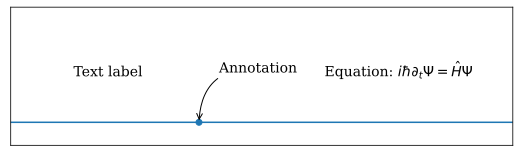

In [ ]:
fig, ax = plt.subplots(figsize=(9, 2.5))

ax.set_yticks([])
ax.set_xticks([])
ax.set_xlim(-0.5, 3.5)
ax.set_ylim(-0.05, 0.25)
ax.axhline(0)

ax.text(0, 0.1, "Text label", fontsize=14, family="serif")

ax.plot(1, 0, 'o')
ax.annotate("Annotation",
            fontsize=14, family="serif",
            xy=(1, 0), xycoords='data',
            xytext=(+20, +50), textcoords='offset points',
            arrowprops=dict(arrowstyle="->", connectionstyle="arc3, rad=.5"))

ax.text(2, 0.1, r"Equation: $i\hbar\partial_t \Psi = \hat{H}\Psi$", fontsize=14, family="serif")

fig.savefig("images/ch4-text-annotation.pdf")

_**Figure 4-11**. Example demonstrating the result of adding text labels and
annotations using ax.text and ax.annotation and including LaTeX formatted
equations in a Matplotlib text label_

_**Table 4-2**. Summary of Selected Font Properties and the Corresponding Keyword Arguments_

![Table2-4](images/table2-4.png)

## Axis Properties

After having created Figure and Axes objects, the data or functions are plotted
using some of the many plot functions provided by Matplotlib, and the appearance
of lines and markers are customized – the last major aspect of a graph that
remains to be configured and fine-tuned is the Axis instances. A two-dimensional
graph has two axis objects: for the horizontal x axis and the vertical y axis.
Each axis can be individually configured with respect to attributes such as the
axis labels, the placement of ticks and the tick labels, and the location and
appearance of the axis itself. In this section we look into the details of how
to control these aspects of a graph.

### Axis Labels and Titles

Arguably the most important property of an axis, which needs to be set in nearly
all cases, is the axis label. We can set the axis labels using the `set_xlabel`
and `set_ylabel` methods: they both take a string with the label as first
arguments. In addition, the optional labelpad argument specifies the spacing, in
units of points, from the axis to the label. This padding is occasionally
necessary to avoid overlap between the axis label and the axis tick labels. The
`set_xlabel` and `set_ylabel` methods also take additional arguments for setting
text properties, such as `color`, `fontsize`, and `fontname`, as discussed in detail
in the previous section. The following code, which produces Figure 4-12,
demonstrates how to use the `set_xlabel` and `set_ylabel` methods and the keyword
arguments discussed here.

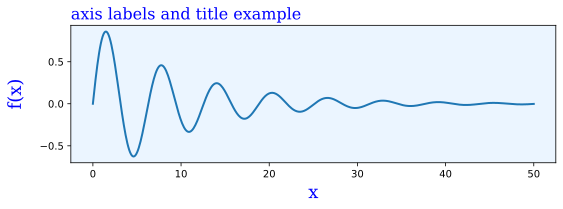

In [ ]:
fig, ax = plt.subplots(figsize=(8, 3), subplot_kw={'facecolor': "#ebf5ff"})

x = np.linspace(0, 50, 500)
ax.plot(x, np.sin(x) * np.exp(-x/10), lw=2)

ax.set_xlabel("x", labelpad=5,
              fontsize=18, fontname='serif', color="blue")
ax.set_ylabel("f(x)", labelpad=15,
              fontsize=18, fontname='serif', color="blue")
ax.set_title("axis labels and title example", loc='left',
             fontsize=16, fontname='serif', color="blue")

fig.tight_layout()
fig.savefig("images/ch4-axis-labels.pdf")

_**Figure 4-12**. Graph demonstrating the result of using `set_xlabel` and `set_ylabel` for setting the x and y axis labels_

In addition to labels on the x and y axes, we can also set a title of an `Axes`
object, using the `set_title` method. This method takes mostly the same arguments
as `set_xlabel` and `set_ylabel`, with the exception of the `loc` argument, which can
be assigned to 'left', 'centered', to 'right', and which dictates that the title
is to be left aligned, centered, or right aligned.

### Axis Range

By default, the range of the x and y axes of a Matplotlib is automatically
adjusted to the data that is plotted in the Axes object. In many cases these
default ranges are sufficient, but in some situations, it may be necessary to
explicitly set the axis ranges. In such cases, we can use the `set_xlim` and
`set_ylim` methods of the `Axes` object. Both these methods take two arguments that
specify the lower and upper limit that is to be displayed on the axis,
respectively. An alternative to `set_xlim` and `set_ylim` is the `axis` method, which,
for example, accepts the string argument 'tight', for a coordinate range that
tightly fit the lines it contains, and 'equal', for a coordinate range where one
unit length along each axis corresponds to the same number of pixels (i.e., a
ratio preserving coordinate system).  

It is also possible to use the `autoscale` method to selectively turn on and off
autoscaling, by passing `True` and `False` as first argument, for the x and/or y
axis by setting its axis argument to `'x'`, `'y'`, or `'both'`. The example below
shows how to use these methods to control axis ranges. The resulting graphs are
shown in Figure 4-13.  


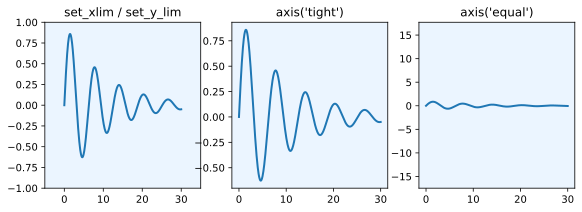

In [ ]:
x = np.linspace(0, 30, 500)
y = np.sin(x) * np.exp(-x/10)

fig, axes = plt.subplots(1, 3, figsize=(9.5, 3), subplot_kw={'facecolor': "#ebf5ff"})

axes[0].plot(x, y, lw=2)
axes[0].set_xlim(-5, 35)
axes[0].set_ylim(-1, 1)
axes[0].set_title("set_xlim / set_y_lim")

axes[1].plot(x, y, lw=2)
axes[1].axis('tight')
axes[1].set_title("axis('tight')")

axes[2].plot(x, y, lw=2)
axes[2].axis('equal')
axes[2].set_title("axis('equal')")

fig.savefig("images/ch4-axis-ranges.pdf")


### Axis Ticks, Tick Labels, and Grids

The final basic properties of the axis that remain to be configured are the
placement of axis ticks and the placement and the formatting of the
corresponding tick labels. The axis ticks are an important part of the overall
appearance of a graph, and when preparing publication and production-quality
graphs, it is often necessary to have detailed control over the axis ticks.
Matplotlib module mpl.ticker provides a general and extensible tick management
system that gives full control of the tick placement. Matplotlib distinguishes
between major ticks and minor ticks. By default, every major tick has a
corresponding label, and the distances between major ticks may be further marked
with minor ticks that do not have labels, although this feature must be
explicitly turned on.  

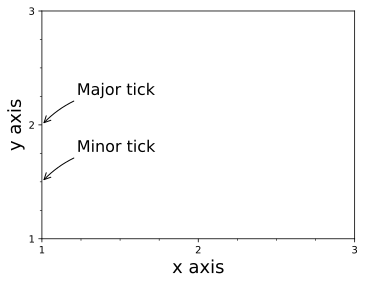

In [ ]:
fig = plt.figure()


ax.text(0.12, 0.06, "(0.15, 0.15)")

ax = fig.add_axes([0.15, 0.15, 0.68, 0.66])
ax.set_yticks([1, 2, 3])
ax.set_xticks([1, 2, 3])

#ax.set_yticklabels(['', '', ''])

ax.set_xlabel("x axis", fontsize=18)
ax.set_ylabel("y axis", fontsize=18)

ax.set_xlim(1,3)
ax.set_ylim(1,3)

ax.xaxis.set_minor_locator(mpl.ticker.MultipleLocator(0.25))
ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(0.25))

ax.annotate("Major tick",
         xy=(1, 2), xycoords='data',
         xytext=(+35, +30), textcoords='offset points', fontsize=16,
         arrowprops=dict(arrowstyle="->", connectionstyle="arc3, rad=.2"))

ax.annotate("Minor tick",
         xy=(1, 1.5), xycoords='data',
         xytext=(+35, +30), textcoords='offset points', fontsize=16,
         arrowprops=dict(arrowstyle="->", connectionstyle="arc3, rad=.2"))

fig.savefig("images/figure-axis-schematic.pdf");

_**Figure 4-14**. The difference between major and minor ticks_


When approaching the configuration of ticks, the most common design target is to
determine where the major tick with labels should be placed along the coordinate
axis.  The `mpl.ticker` module provides classes for different tick placement
strategies. For example, the `mpl.ticker.MaxNLocator` can be used to set the
maximum number ticks (at unspecified locations), the
`mpl.ticker.MultipleLocator` can be used for setting ticks at multiples of a
given base, and the `mpl.ticker.FixedLocator` can be used to place ticks at
explicitly specified coordinates. To change ticker strategy, we can use the
`set_major_locator` and the `set_minor_locator` methods in `Axes.xaxis` and
`Axes.  yaxis`. These methods accept an instance of a ticker class defined in
`mpl.ticker` or a custom class that is derived from one of those classes.

When explicitly specifying tick locations, we can also use the methods
`set_xticks` and `set_yticks`, which accept a list of coordinates for where to
place major ticks. In this case, it is also possible to set custom labels for
each tick using the `set_xticklabels` and `set_yticklabels`, which expects lists
of strings to use as labels for the corresponding ticks. If possible, it is a
good idea to use generic tick placement strategies, for example,
`mpl.ticker.MaxNLocator`, because they dynamically adjust if the coordinate
range is changed, whereas explicit tick placement using `set_xticks` and
`set_yticks` then would require manual code changes. However, when the exact
placement of ticks must be controlled, then `set_xticks` and `set_yticks` are
convenient methods.

The following code demonstrates how to change the default tick placement using
combinations of the methods discussed in the previous paragraphs, and the
resulting graphs are shown in Figure 4-15.

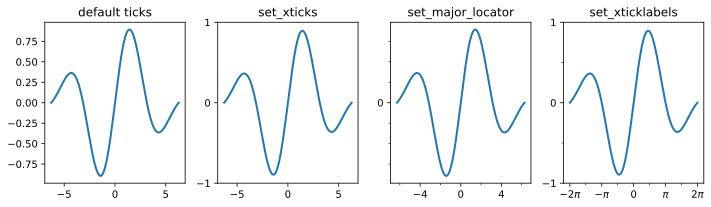

In [ ]:
x = np.linspace(-2 * np.pi, 2 * np.pi, 500)
y = np.sin(x) * np.exp(-x**2/20)

fig, axes = plt.subplots(1, 4, figsize=(10, 3))

axes[0].plot(x, y, lw=2)
axes[0].set_title("default ticks")

axes[1].plot(x, y, lw=2)
axes[1].set_yticks([-1, 0, 1])
axes[1].set_xticks([-5, 0, 5])
axes[1].set_title("set_xticks")

axes[2].plot(x, y, lw=2)
axes[2].xaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
axes[2].yaxis.set_major_locator(mpl.ticker.FixedLocator([-1, 0, 1]))
axes[2].xaxis.set_minor_locator(mpl.ticker.MaxNLocator(8))
axes[2].yaxis.set_minor_locator(mpl.ticker.MaxNLocator(8))
axes[2].set_title("set_major_locator")

axes[3].plot(x, y, lw=2)
axes[3].set_yticks([-1, 0, 1])
axes[3].set_xticks([-2 * np.pi, -np.pi, 0, np.pi, 2 * np.pi])
axes[3].set_xticklabels(['$-2\pi$', '$-\pi$', 0, r'$\pi$', r'$2\pi$'])
axes[3].xaxis.set_minor_locator(mpl.ticker.FixedLocator([-3 * np.pi / 2, -np.pi/2, 0, np.pi/2, 3 * np.pi/2]))
axes[3].yaxis.set_minor_locator(mpl.ticker.MaxNLocator(4))
axes[3].set_title("set_xticklabels")

fig.tight_layout()
fig.savefig("images/ch4-axis-ticks.pdf")

_**Figure 4-15**. Graphs that demonstrate different ways of controlling the placement
and appearance of major and minor ticks along the x axis and the y axis_

A commonly used design element in graphs is grid lines, which are intended as a
visual guide when reading values from the graph. Grids and grid lines are
closely related to axis ticks, since they are drawn at the same coordinate
values, and are therefore essentially extensions of the ticks that span across
the graph. In Matplotlib, we can turn on axis grids using the grid method of an
axes object. The grid method takes optional keyword arguments that are used to
control the appearance of the grid. For example, like many of the plot functions
in Matplotlib, the grid method accepts the arguments `color`, `linestyle`, and
`linewidth`, for specifying the properties of the grid lines. In addition, it
takes argument which and axis that can be assigned values `'major'`, `'minor'`,
or `'both'`, and `'x'`, `'y'`, or `'both'`, respectively. These arguments are
used to indicate which ticks along which axis the given style is to be applied
to. If several different styles for the grid lines are required, multiple calls
to `grid` can be used, with different values of `which` and `axis`. For an
example of how to add grid lines and how to style them in different ways, see
the following example, which produces the graphs shown in Figure 4-16.

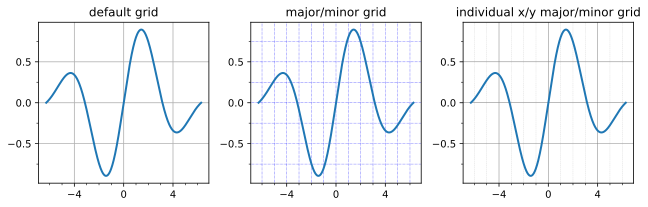

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(9, 3))

x_major_ticker = mpl.ticker.MultipleLocator(4)
x_minor_ticker = mpl.ticker.MultipleLocator(1)
y_major_ticker = mpl.ticker.MultipleLocator(0.5)
y_minor_ticker = mpl.ticker.MultipleLocator(0.25)

for ax in axes:
    ax.plot(x, y, lw=2)
    ax.xaxis.set_major_locator(x_major_ticker)
    ax.yaxis.set_major_locator(y_major_ticker)
    ax.xaxis.set_minor_locator(x_minor_ticker)
    ax.yaxis.set_minor_locator(y_minor_ticker)

axes[0].set_title("default grid")
axes[0].grid()

axes[1].set_title("major/minor grid")
axes[1].grid(color="blue", which="both", linestyle=':', linewidth=0.5)

axes[2].set_title("individual x/y major/minor grid")
axes[2].grid(color="grey", which="major", axis='x', linestyle='-', linewidth=0.5)
axes[2].grid(color="grey", which="minor", axis='x', linestyle=':', linewidth=0.25)
axes[2].grid(color="grey", which="major", axis='y', linestyle='-', linewidth=0.5)

fig.tight_layout()
fig.savefig("images/ch4-axis-grid.pdf")

In addition to controlling the tick placements, the Matplotlib mpl.ticker module
also provides classes for customizing the tick labels. For example, the
`ScalarFormatter` from the `mpl.ticker` module can be used to set several useful
properties related to displaying tick labels with scientific notation, for
displaying axis labels for large numerical values. If scientific notation is
activated using the `set_scientific` method, we can control the threshold for
when scientific notation is used with the set_ powerlimits method (by default,
tick labels for small numbers are not displayed using the scientific notation),
and we can use the `useMathText=True` argument when creating the `ScalarFormatter`
instance in order to have the exponents shown in math style rather than using
code style exponents (e.g., 1e10). See the following code for an example of
using scientific notation in tick labels. The resulting graphs are shown in
Figure 4-17.

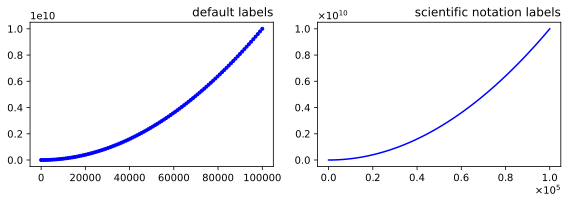

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 3))

x = np.linspace(0, 1e5, 100)
y = x ** 2

axes[0].plot(x, y, 'b.')
axes[0].set_title("default labels", loc='right')

axes[1].plot(x, y, 'b')
axes[1].set_title("scientific notation labels", loc='right')

formatter = mpl.ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
axes[1].xaxis.set_major_formatter(formatter)
axes[1].yaxis.set_major_formatter(formatter)

fig.tight_layout()
fig.savefig("images/ch4-axis-scientific.pdf")

_**Figure 4-17**. Graphs with tick labels in scientific notation. The left panel uses the
default label formatting, while the right panel uses tick labels in scientific notation, rendered as math text._

###  Log Plots

In visualization of data that spans several orders of magnitude, it is useful to
work with logarithmic coordinate systems. In Matplotlib, there are several plot
functions for graphing functions in such coordinate systems, for example,
`loglog`, `semilogx`, and `semilogy`, which use logarithmic scales for both the $x$ and
$y$ axes, for only the $x$ axis, and for only the $y$ axis, respectively. Apart from
the logarithmic axis scales, these functions behave similarly to the standard
plot method. An alternative approach is to use the standard plot method and to
separately configure the axis scales to be logarithmic using the `set_xscale`
and/or `set_yscale` method with `'log'` as first argument. These methods of
producing log-scale plots are exemplified in the following section, and the
resulting graphs are shown in Figure 4-18.

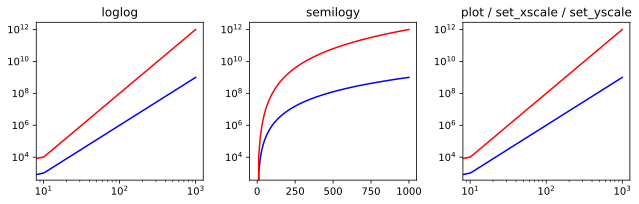

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(9, 3))

x = np.linspace(0, 1e3, 100)
y1, y2 = x**3, x**4

axes[0].set_title('loglog')
axes[0].loglog(x, y1, 'b', x, y2, 'r')

axes[1].set_title('semilogy')
axes[1].semilogy(x, y1, 'b', x, y2, 'r')

axes[2].set_title('plot / set_xscale / set_yscale')
axes[2].plot(x, y1, 'b', x, y2, 'r')
axes[2].set_xscale('log')
axes[2].set_yscale('log')

fig.tight_layout()
fig.savefig("images/ch4-axis-log-plots.pdf")


### Twin Axes

An interesting trick with axes that Matplotlib provides is the twin axis
feature, which allows displaying two independent axes overlaid on each other.
This is useful when plotting two different quantities, for example, with
different units, within the same graph.  A simple example that demonstrates this
feature is shown as follows, and the resulting graph is shown in Figure 4-19.
Here we use the `twinx` method (there is also a `twiny` method) to produce second
Axes instance with shared x axis and a new independent y axis, which is
displayed on the right side of the graph.

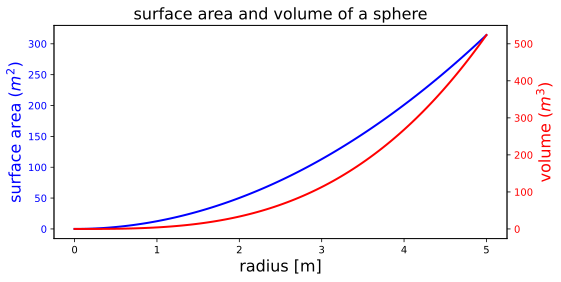

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 4))

r = np.linspace(0, 5, 100)
a = 4 * np.pi * r ** 2  # area
v = (4 * np.pi / 3) * r ** 3  # volume


ax1.set_title("surface area and volume of a sphere", fontsize=16)
ax1.set_xlabel("radius [m]", fontsize=16)

ax1.plot(r, a, lw=2, color="blue")
ax1.set_ylabel(r"surface area ($m^2$)", fontsize=16, color="blue")
for label in ax1.get_yticklabels():
    label.set_color("blue")

ax2 = ax1.twinx()
ax2.plot(r, v, lw=2, color="red")
ax2.set_ylabel(r"volume ($m^3$)", fontsize=16, color="red")
for label in ax2.get_yticklabels():
    label.set_color("red")

fig.tight_layout()
fig.savefig("images/ch4-axis-twin-ax.pdf")

 Spines In all graphs generated so far, we have always had a box surrounding the
 Axes region.  This is indeed a common style for scientific and technical
 graphs, but in some cases, for example, when representing schematic graphs,
 moving these coordinate lines may be desired. The lines that make up the
 surrounding box are called axis spines in Matplotlib, and we can use the
 `Axes.spines` attribute to change their properties. For example, we might want to
 remove the top and the right spines and move the spines to coincide with the
 origin of the coordinate systems.

The `spines` attribute of the `Axes` object is a dictionary with the keys `right`,
`left`, `top`, and `bottom` that can be used to access each spine individually. We can
use the set_color method to set the color to 'None' to indicate that a
particular spine should not be displayed, and in this case, we also need to
remove the ticks associated with that spine, using the set_ticks_position method
of `Axes.xaxis` and `Axes.yaxis` (which accepts the arguments 'both', 'top', or
'bottom' and 'both', 'left', or 'right', respectively). With these methods we
can transform the surrounding box to x and y coordinate axes, as demonstrated in
the following example. The resulting graph is shown in Figure 4-20.

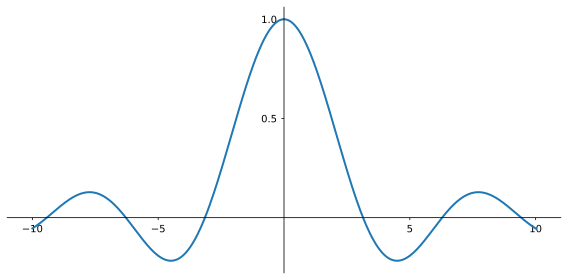

In [ ]:
x = np.linspace(-10, 10, 500)
y = np.sin(x) / x

fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(x, y, linewidth=2)

# remove top and right spines
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

# remove bottom and left spine ticks
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

# move bottom and left spine to x = 0 and y = 0
ax.spines['bottom'].set_position(('data', 0))
ax.spines['left'].set_position(('data', 0))

ax.set_xticks([-10, -5, 5, 10])
ax.set_yticks([0.5, 1])

# give each label a solid background of white, to not overlap with the plot line
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_bbox({'facecolor': 'white',
                    'edgecolor': 'white'})

fig.tight_layout()
fig.savefig("images/ch4-axis-spines.pdf")

## Advanced Axes Layouts

So far, we have repeatedly used `plt.figure`, `Figure.make_axes`, and `plt.subplots`
to create new `Figure` and `Axes` instances, which we then used for producing
graphs. In scientific and technical visualization, it is common to pack together
multiple figures in different panels, for example, in a grid layout. In
Matplotlib there are functions for automatically creating Axes objects and
placing them on a figure canvas, using a variety of different layout strategies.
We have already used the `plt.subplots` function, which is capable of generating a
uniform grid of Axes objects. In this section we explore additional features of
the plt.subplots function and introduce the `subplot2grid` and `GridSpec` layout
managers, which are more flexible in how the Axes objects are distributed within
a figure canvas.

### Insets

Before diving into the details of how to use more advanced `Axes` layout managers,
it is worth taking a step back and considering an important use-case of the very
first approach we used to add Axes instances to a figure canvas: the
`Figure.add_axes` method. This approach is well suited for creating so-called
inset, which is a smaller graph that is displayed within the region of another
graph. Insets are, for example, frequently used for displaying a magnified
region of special interest in the larger graph or for displaying some related
graphs of secondary importance.  

In Matplotlib we can place additional `Axes` objects at arbitrary locations within
a figure canvas, even if they overlap with existing `Axes` objects. To create an
inset, we therefore simply add a new `Axes` object with `Figure.make_axes` and with
the (figure canvas) coordinates for where the inset should be placed. A typical
example of a graph with an inset is produced by the following code, and the
graph that this code generates is shown in Figure 4-21. When creating the Axes
object for the inset, it may be useful to use the argument `facecolor='none'`,
which indicates that there should be no background color, that is, that the `Axes`
background of the inset should be transparent.

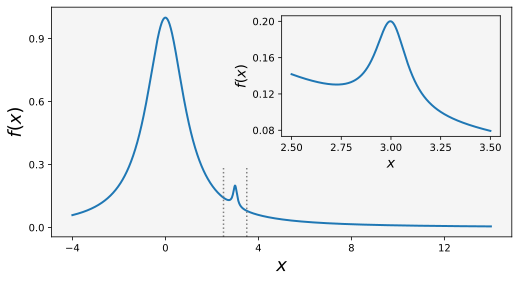

In [ ]:
fig = plt.figure(figsize=(8, 4))

def f(x):
    return 1/(1 + x**2) + 0.1/(1 + ((3 - x)/0.1)**2)

def plot_and_format_axes(ax, x, f, fontsize):
    ax.plot(x, f(x), linewidth=2)
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
    ax.set_xlabel(r"$x$", fontsize=fontsize)
    ax.set_ylabel(r"$f(x)$", fontsize=fontsize)

# main graph
ax = fig.add_axes([0.1, 0.15, 0.8, 0.8], facecolor="#f5f5f5")
x = np.linspace(-4, 14, 1000)
plot_and_format_axes(ax, x, f, 18)

# inset
x0, x1 = 2.5, 3.5
ax.axvline(x0, ymax=0.3, color="grey", linestyle=":")
ax.axvline(x1, ymax=0.3, color="grey", linestyle=":")

ax = fig.add_axes([0.5, 0.5, 0.38, 0.42], facecolor='none')
x = np.linspace(x0, x1, 1000)
plot_and_format_axes(ax, x, f, 14)

fig.savefig("images/ch4-advanced-axes-inset.pdf")

_**Figure 4-21**. Example of a graph with an inset_

## Subplots

We have already used `plt.subplots` extensively, and we have noted that it returns
a tuple with a `Figure` instance and a NumPy array with the `Axes` objects for each
row and column that was requested in the function call. It is often the case
when plotting grids of subplots that either the $x$ or the $y$ axis, or both, is
shared among the subplots. Using the sharex and sharey arguments to `plt.subplots`
can be useful in such situations, since it prevents the same axis labels to be
repeated across multiple `Axes`.

It is also worth noting that the dimension of the NumPy array with `Axes`
instances that is returned by `plt.subplots` is “squeezed” by default: that is,
the dimensions with length 1 are removed from the array. If both the requested
numbers of column and row are greater than one, then a two-dimensional array is
returned, but if either (or both) the number of columns or rows is one, then a
one-dimensional (or scalar, i.e., the only `Axes` object itself) is returned. We
can turn off the squeezing of the dimensions of the NumPy arrays by passing the
argument `squeeze=False` to the `plt.subplots` function. In this case the axes
variable in `fig, axes = plt.subplots(nrows, ncols)` is always a two-dimensional
array.

A final touch of configurability can be achieved using the `plt.subplots_adjust`
function, which allows to explicitly set the left, right, bottom, and top
coordinates of the overall `Axes` grid, as well as the width (`wspace`) and height
spacing (`hspace`) between `Axes` instances in the grid. See the following code, and
the corresponding Figure 4-22, for a step-by-step example of how to set up an
Axes grid with shared x and y axes and with adjusted `Axes` spacing.

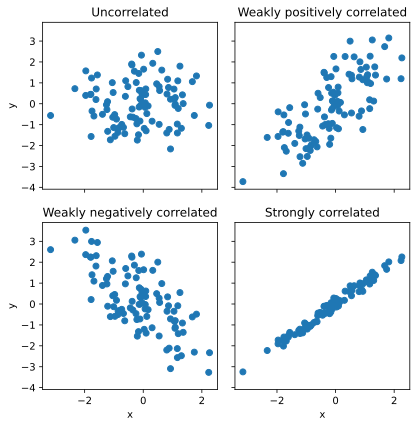

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(6, 6), sharex=True, sharey=True, squeeze=False)

x1 = np.random.randn(100)
x2 = np.random.randn(100)

axes[0, 0].set_title("Uncorrelated")
axes[0, 0].scatter(x1, x2)

axes[0, 1].set_title("Weakly positively correlated")
axes[0, 1].scatter(x1, x1 + x2)

axes[1, 0].set_title("Weakly negatively correlated")
axes[1, 0].scatter(x1, -x1 + x2)

axes[1, 1].set_title("Strongly correlated")
axes[1, 1].scatter(x1, x1 + 0.15 * x2)

axes[1, 1].set_xlabel("x")
axes[1, 0].set_xlabel("x")
axes[0, 0].set_ylabel("y")
axes[1, 0].set_ylabel("y")

plt.subplots_adjust(left=0.1, right=0.95, bottom=0.1, top=0.95, wspace=0.1, hspace=0.2)

fig.savefig("images/ch4-advanced-axes-subplots.pdf")

_**Figure 4-22**. Example graph using `plt.subplot` and `plt.subplot_adjust`_

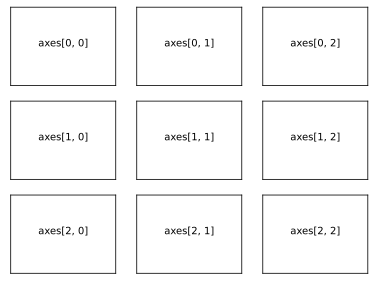

In [ ]:
ncols, nrows = 3, 3

fig, axes = plt.subplots(nrows, ncols)

for m in range(nrows):
    for n in range(ncols):
        axes[m, n].set_xticks([])
        axes[m, n].set_yticks([])
        axes[m, n].text(0.5, 0.5, "axes[%d, %d]" % (m, n),
                        horizontalalignment='center')

## Subplot2grid

The `plt.subplot2grid` function is an intermediary between `plt.subplots` and
`gridspec` (see the next section) that provides a more flexible `Axes` layout
management than `plt.subplots` while at the same time being simpler to use than
`gridspec`. In particular, `plt.subplot2grid` is able to create grids with
`Axes` instances that span multiple rows and/or columns. The `plt.subplot2grid`
takes two mandatory arguments: the first argument is the shape of the Axes grid,
in the form of a tuple (`nrows`, `ncols`), and the second argument is a tuple
(`row`, `col`) that specifies the starting position within the grid. The two
optional keyword arguments `colspan` and `rowspan` can be used to indicate how
many rows and columns the new Axes instance should span. An example of how to
use the `plt.subplot2grid` function is given in Table 4-3. Note that each call  
to the `plt.subplot2grid` function results in one new `Axes` instance, in
contrast to  `plt.subplots` which creates all `Axes` instances in one function
call and returns them a NumPy array.

_**Table 4-3**. Example of a Grid Layout Created with `plt.subplot2grid` and the Corresponding Code_

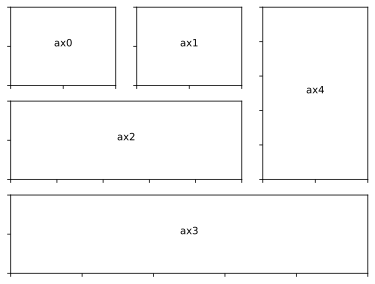

In [ ]:
fig = plt.figure()

def clear_ticklabels(ax):
    ax.set_yticklabels([])
    ax.set_xticklabels([])

ax0 = plt.subplot2grid((3, 3), (0, 0))
ax1 = plt.subplot2grid((3, 3), (0, 1))
ax2 = plt.subplot2grid((3, 3), (1, 0), colspan=2)
ax3 = plt.subplot2grid((3, 3), (2, 0), colspan=3)
ax4 = plt.subplot2grid((3, 3), (0, 2), rowspan=2)

axes = [ax0, ax1, ax2, ax3, ax4]
[ax.text(0.5, 0.5, "ax%d" % n, horizontalalignment='center') for n, ax in enumerate(axes)]
[clear_ticklabels(ax) for ax in axes]

fig.savefig("images/ch4-advanced-axes-subplot2grid.pdf")


##  GridSpec

The final grid layout manager that we cover here is `GridSpec` from the
`mpl.gridspec` module. This is the most general grid layout manager in Matplotlib,
and in particular it allows creating grids where not all rows and columns have
equal width and height, which is not easily achieved with the grid layout
managers we have used earlier in this chapter.

A `GridSpec` object is only used to specify the grid layout, and by itself it does
not create any `Axes` objects. When creating a new instance of the `GridSpec` class,
we must specify the number of rows and columns in the grid. Like for other grid
layout managers, we can also set the position of the grid using the keyword
arguments left, bottom, right, and top, and we can set the width and height
spacing between subplots using wspace and hspace. Additionally, `GricSpec` allows
specifying the relative width and heights of columns and rows using the
`width_ratios` and `height_ratios` arguments.  These should both be lists with
relative weights for the size of each column and row in the grid. For example,
to generate a grid with two rows and two columns, where the first row and column
is twice as big as the second row and column, we could use `mpl.
gridspec.GridSpec(2, 2, width_ratios=[2, 1], height_ratios=[2, 1])`.

Once a GridSpec instance has been created, we can use the `Figure.add_subplot`
method to create `Axes` objects and place them on a figure canvas. As argument to
`add_subplot`, we need to pass an `mpl.gridspec.SubplotSpec` instance, which we can
generate from the `GridSpec` object using an array-like indexing: for example,
given a `GridSpec` instance `gs`, we obtain a `SubplotSpec` instance for the
upper-left grid element using `gs[0, 0]` and for a `SubplotSpec` instance that
covers the first row we use `gs[:, 0]` and so on. See Table 4-4 for concrete
examples of how to use `GridSpec` and `add_subplot` to create `Axes` instance.

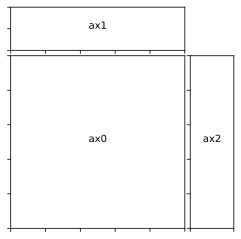

In [ ]:
fig = plt.figure(figsize=(4, 4))

gs = mpl.gridspec.GridSpec(2, 2,
                           width_ratios=[4, 1],
                           height_ratios=[1, 4],
                           wspace=0.05, hspace=0.05
                           )

ax0 = fig.add_subplot(gs[1, 0])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 1])

def clear_ticklabels(ax):
    ax.set_yticklabels([])
    ax.set_xticklabels([])

axes = [ax0, ax1, ax2]
[ax.text(0.5, 0.5, "ax%d" % n, horizontalalignment='center') for n, ax in enumerate(axes)]
[clear_ticklabels(ax) for ax in axes]

fig.savefig("images/ch4-advanced-axes-gridspec-2.pdf")


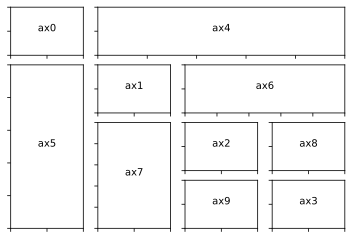

In [ ]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(6, 4))

gs = mpl.gridspec.GridSpec(4, 4)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 1])
ax2 = fig.add_subplot(gs[2, 2])
ax3 = fig.add_subplot(gs[3, 3])

ax4 = fig.add_subplot(gs[0, 1:])
ax5 = fig.add_subplot(gs[1:, 0])

ax6 = fig.add_subplot(gs[1, 2:])
ax7 = fig.add_subplot(gs[2:, 1])

ax8 = fig.add_subplot(gs[2, 3])
ax9 = fig.add_subplot(gs[3, 2])


def clear_ticklabels(ax):
    ax.set_yticklabels([])
    ax.set_xticklabels([])

axes = [ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9]
[ax.text(0.5, 0.5, "ax%d" % n, horizontalalignment='center') for n, ax in enumerate(axes)]
[clear_ticklabels(ax) for ax in axes]

fig.savefig("images/ch4-advanced-axes-gridspec-1.pdf")



## Colormap Plots

We have so far only considered graphs of univariate functions or, equivalently,
two- dimensional data in x-y format. The two-dimensional `Axes` objects that we
have used for this purpose can also be used to visualize bivariate functions, or
three-dimensional data on x-y-z format, using so-called color maps (or heat
maps), where each pixel in the `Axes` area is colored according to the z value
corresponding to that point in the coordinate system. Matplotlib provides the
functions `pcolor` and `imshow` for these types of plots, and the `contour` and
`contourf` functions graph data on the same format by drawing contour lines rather
than color maps. Examples of graphs generated with these functions are shown in
Figure 4-23.

In [ ]:
x = y = np.linspace(-2, 2, 150)
X, Y = np.meshgrid(x, y)

R1 = np.sqrt((X+0.5)**2 + (Y+0.5)**2)
R2 = np.sqrt((X+0.5)**2 + (Y-0.5)**2)
R3 = np.sqrt((X-0.5)**2 + (Y+0.5)**2)
R4 = np.sqrt((X-0.5)**2 + (Y-0.5)**2)

fig, axes = plt.subplots(1, 4, figsize=(10.5, 2.2))

Z = np.sin(10 * R1) / (10 * R1) + np.sin(20 * R4) / (20 * R4)


p = axes[0].pcolor(X, Y, Z, cmap='seismic', vmin=-abs(Z).max(), vmax=abs(Z).max())
axes[0].axis('tight')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
axes[0].set_title("pcolor")
axes[0].xaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
axes[0].yaxis.set_major_locator(mpl.ticker.MaxNLocator(4))


cb = fig.colorbar(p, ax=axes[0])
cb.set_label("z")
cb.set_ticks([-1, -.5, 0, .5, 1])


Z = 1/R1 - 1/R2 - 1/R3 + 1/R4

im = axes[1].imshow(Z, vmin=-1, vmax=1, cmap=mpl.cm.bwr,
               extent=[x.min(), x.max(), y.min(), y.max()])
im.set_interpolation('bilinear')

axes[1].axis('tight')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
axes[1].set_title("imshow")
cb = fig.colorbar(im, ax=axes[1])

axes[1].xaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
axes[1].yaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
#cb.ax.set_axes_locator(mpl.ticker.MaxNLocator(4))
cb.set_label("z")
cb.set_ticks([-1, -.5, 0, .5, 1])

x = y = np.linspace(0, 1, 75)
X, Y = np.meshgrid(x, y)
Z = - 2 * np.cos(2 * np.pi * X) * np.cos(2 * np.pi * Y) - 0.7 * np.cos(np.pi - 4*np.pi*X)


c = axes[2].contour(X, Y, Z, 15, cmap=mpl.cm.RdBu, vmin=-1, vmax=1)

axes[2].axis('tight')
axes[2].set_xlabel('x')
axes[2].set_ylabel('y')
axes[2].set_title("contour")

axes[2].xaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
axes[2].yaxis.set_major_locator(mpl.ticker.MaxNLocator(4))


c = axes[3].contourf(X, Y, Z, 15, cmap=mpl.cm.RdBu, vmin=-1, vmax=1)

axes[3].axis('tight')
axes[3].set_xlabel('x')
axes[3].set_ylabel('y')
axes[3].set_title("contourf")

axes[3].xaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
axes[3].yaxis.set_major_locator(mpl.ticker.MaxNLocator(4))

fig.tight_layout()
fig.savefig('images/ch4-colormaps.pdf')


_**Figure 4-23**. Example graphs generated with `pcolor`, `imshow`, `contour`, and `contourf`_

To produce a colormap graph, for example, using `pcolor`, we first need to prepare
the data in the appropriate format. While standard two-dimensional graphs expect
one-dimensional coordinate arrays with x and y values, in the present case, we need to
use two-dimensional coordinate arrays, as, for example, generated using the NumPy
`meshgrid` function. To plot a bivariate function or data with two dependent variables,
we start by defining one-dimensional coordinate arrays, x and y, that span the desired
coordinate range or correspond to the values for which data is available. The x and y
arrays can then be passed to the `np.meshgrid` function, which produces the required
two-dimensional coordinate arrays `X` and `Y`. If necessary, we can use NumPy array
computations with X and Y to evaluate bivariate functions to obtain a data array Z, as
done in lines 1 to 3 in In [25] (see in the following section).

Once the two-dimensional coordinate and data arrays are prepared, they are
easily visualized using, for example, `pcolor`, `contour`, or `contourf`, by
passing the `X`, `Y`, and `Z` arrays as the first three arguments. The `imshow`
method works similarly but only expects the data array `Z` as argument, and the
relevant coordinate ranges must instead be set using the extent argument, which
should be set to a list on the format `[xmin, xmax, ymin, ymax]`. Additional
keyword arguments that are important for controlling the appearance of colormap
graphs are `vmin`, `vmax`, `norm`, and `cmap`: the `vmin` and `vmax` can be used
to set the range of values that are mapped to the color axis. This can
equivalently be achieved by setting `norm=mpl.colors.Normalize(vmin, vmax)`. The
`cmap` argument specifies a color map for mapping the data values to colors in
the graph. This argument can either be a string with a predefined colormap name
or a colormap instance. The predefined color maps in Matplotlib are available in
`mpl.cm`. Try `help(mpl.cm)` or try to autocomplete in IPython on the mpl.cm
module for a full list of available color maps. (A nice visualization of all the
available color maps is available at
[scipy](http://wiki.scipy.org/Cookbook/Matplotlib/Show_colormaps). This page
also describes how to create new color maps.)

The last piece required for a complete colormap plot is the colorbar element,
which gives the viewer of the graph a way to read off the numerical values that
different colors correspond to. In Matplotlib we can use the `plt.colorbar`
function to attach a colorbar to an already plotted colormap graph. It takes a
handle to the plot as first argument, and it takes two optional arguments `ax` and
`cax`, which can be used to control where in the graph the colorbar is to appear.
If `ax` is given, the space will be taken from this `Axes` object for the new
colorbar. If, on the other hand, `cax` is given, then the colorbar will draw on
this Axes object. A colorbar instance `cb` has its own axis object, and the
standard methods for setting axis attributes can be used on the `cb.ax` object,
and we can use, for example, the `set_label`, `set_ticks`, and `set_ticklabels` method
in the same manner as for $x$ and $y$ axes.

The steps outlined in the previous paragraphs are shown in the following code,
and the resulting graph is shown in Figure 4-24. The functions `imshow`, `contour`,
and `contourf` can be used in a nearly similar manner, although these functions
take additional arguments for controlling their characteristic properties. For
example, the `contour` and `contourf` functions additionally take an argument `N` that
specifies the number of contour lines to draw.

In [ ]:
x = y = np.linspace(-10, 10, 150)
X, Y = np.meshgrid(x, y)
Z = np.cos(X) * np.cos(Y) * np.exp(-(X/5)**2-(Y/5)**2)

fig, ax = plt.subplots(figsize=(3, 2.5))

p = ax.pcolor(X, Y, Z, vmin=-abs(Z).max(), vmax=abs(Z).max(), cmap=mpl.cm.bwr)

ax.axis('tight')
ax.set_xlabel(r"$x$", fontsize=8)
ax.set_ylabel(r"$y$", fontsize=8)
ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(4))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(4))

cb = fig.colorbar(p, ax=ax)
cb.set_label(r"$z$", fontsize=8)
cb.set_ticks([-1, -.5, 0, .5, 1])

fig.savefig("images/ch4-colormap-pcolor.pdf")


_**Figure 4-24**. Example using pcolor to produce a colormap graph_

## 3D Plots

The colormap graphs discussed in the previous section were used to visualize
data with two dependent variables by color-coding data in 2D graphs. Another way
of visualizing the same type of data is to use 3D graphs, where a third axis $z$
is introduced and the graph is displayed in a perspective on the screen. In
Matplotlib, drawing 3D graphs requires using a different axes object, namely,
the `Axes3D` object that is available from the `mpl_toolkits.mplot3d` module. We
can create a 3D-aware Axes instance explicitly using the constructor of the
Axes3D class, by passing a Figure instance as argument: `ax = Axes3D(fig)`.
Alternatively, we can use the `add_subplot` function with the `projection='3d'`
argument:

`ax = ax = fig.add_subplot(1, 1, 1, projection='3d')`

or use plt.subplots with the `subplot_kw={'projection': '3d'}` argument:

`fig, ax = plt.subplots(1, 1, figsize=(8, 6), subplot_kw={'projection': '3d'})`

In this way, we can use all of the axes layout approaches we have previously used for
2D graphs, if only we specify the projection argument in the appropriate manner. Note
that using `add_subplot`, it is possible to mix axes objects with 2D and 3D projections
within the same figure, but when using `plt.subplots`, the `subplot_kw` argument applies
to all the subplots added to a figure.

Having created and added 3D-aware Axes instances to a figure, for example, using
one of the methods described in the previous paragraph, the `Axes3D` class methods –
such as `plot_surface`, `plot_wireframe`, and `contour` – can be used to plot data as
surfaces in a 3D perspective. These functions are used in a manner that is nearly the
same as how the color map was used in the previous section: these 3D plotting functions
all take two-dimensional coordinate and data arrays `X`, `Y`, and `Z` as first arguments. Each
function also takes additional parameters for tuning specific properties. For example,
the `plot_surface` function takes the arguments `rstride` and `cstride` (row and column
stride) for selecting data from the input arrays (to avoid data points that are too dense).
The `contour` and `contourf` functions take optional arguments `zdir` and `offset`, which
is used to select a projection direction (the allowed values are “`x`,” “`y`,” and “`z`”) and the
plane to display the projection on.

In addition to the methods for 3D surface plotting, there are also straightforward
generalizations of the line and scatter plot functions that are available for 2D axes, for
example, `plot`, `scatter`, `bar`, and `bar3d`, which in the version that is available in the
Axes3D class takes an additional argument for the z coordinates. Like their 2D relatives,
these functions expect one-dimensional data arrays rather than the two-dimensional
coordinate arrays that are used for surface plots.

When it comes to axes titles, labels, ticks, and tick labels, all the methods
used for 2D graphs, as described in detail earlier in this chapter, are
straightforwardly generalized to 3D graphs. For example, there are new methods
`set_zlabel`, `set_zticks`, and `set_zticklabels` for manipulating the attributes of
the new z axis. The `Axes3D` object also provides new class methods for 3D
specific actions and attributes. In particular, the `view_init` method can be used
to change the angle from which the graph is viewed, and it takes the elevation
and the azimuth, in degrees, as first and second arguments.

Examples of how to use these 3D plotting functions are given in the following
section, and the produced graphs are shown in Figure 4-25.


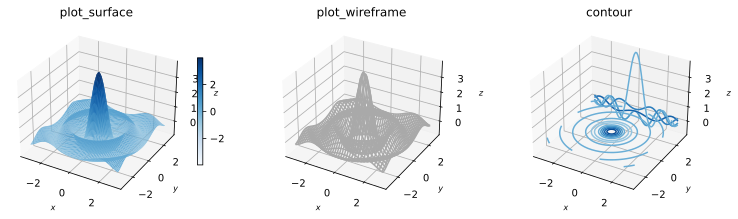

In [ ]:
from mpl_toolkits.mplot3d.axes3d import Axes3D

x = y = np.linspace(-3, 3, 74)
X, Y = np.meshgrid(x, y)

R = np.sqrt(X**2 + Y**2)
Z = np.sin(4 * R) / R

fig, axes = plt.subplots(1, 3, figsize=(10.5, 3), subplot_kw={'projection': '3d'})

def title_and_labels(ax, title):
    ax.set_title(title)
    ax.set_xlabel("$x$", fontsize=8)
    ax.set_ylabel("$y$", fontsize=8)
    ax.set_zlabel("$z$", fontsize=8)

norm = mpl.colors.Normalize(-abs(Z).max(), abs(Z).max())

p = axes[0].plot_surface(X, Y, Z, rstride=1, cstride=1, linewidth=0, antialiased=False, norm=norm, cmap=mpl.cm.Blues)
cb = fig.colorbar(p, ax=axes[0], shrink=0.6)
title_and_labels(axes[0], "plot_surface")

p = axes[1].plot_wireframe(X, Y, Z, rstride=2, cstride=2, color="darkgrey")
title_and_labels(axes[1], "plot_wireframe")

cset = axes[2].contour(X, Y, Z, zdir='z', offset=0, norm=norm, cmap=mpl.cm.Blues)
cset = axes[2].contour(X, Y, Z, zdir='y', offset=3, norm=norm, cmap=mpl.cm.Blues)
title_and_labels(axes[2], "contour")

fig.tight_layout()
fig.savefig("images/ch4-3d-plots.png", dpi=200)



_**Figure 4-25**. 3D surface and contour graphs generated by using `plot_surface`, `plot_wireframe`, and `contour`_

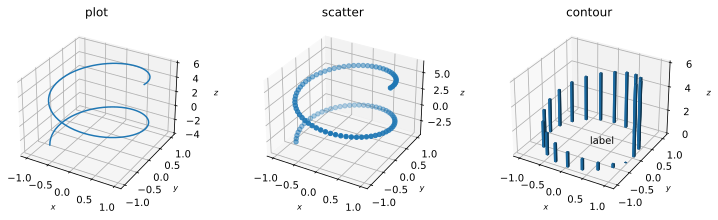

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10.5, 3), subplot_kw={'projection': '3d'})

def title_and_labels(ax, title):
    ax.set_title(title)
    ax.set_xlabel("$x$", fontsize=8)
    ax.set_ylabel("$y$", fontsize=8)
    ax.set_zlabel("$z$", fontsize=8)

norm = mpl.colors.Normalize(-abs(Z).max(), abs(Z).max())

r = np.linspace(0, 10, 100)
p = axes[0].plot(np.cos(r), np.sin(r), 6 - r)
#cb = fig.colorbar(p, ax=axes[0], shrink=0.6)
title_and_labels(axes[0], "plot")

p = axes[1].scatter(np.cos(r), np.sin(r), 6 - r)
title_and_labels(axes[1], "scatter")

r = np.linspace(0, 6, 20)
p = axes[2].bar3d(np.cos(r), np.sin(r), 0* np.ones_like(r), 0.05* np.ones_like(r), 0.05 * np.ones_like(r), 6 - r)
title_and_labels(axes[2], "contour")
axes[2].text(0, 0, 0, "label")
fig.tight_layout()
#fig.savefig("ch4-3d-plots.png", dpi=200)

## Summary

In this chapter, we have covered the basics of how to produce 2D and 3D graphics
using Matplotlib. Visualization is one of the most important tools for
computational scientists and engineers, both as an analysis tool while working
on computational problems and for presenting and communicating computational
results. Visualization is therefore an integral part of the computational
workflow, and it is equally important to be able to quickly visualize and
explore data and to be able to produce picture-perfect publication- quality
graphs, with detailed control over every graphical element. Matplotlib is a
great general-purpose tool for both exploratory visualization and for producing
publication- quality graphics. However, there are limitations to what can be
achieved with Matplotlib, especially with respect to interactivity and
high-quality 3D graphics. For more specialized use-cases, I therefore recommend
to also explore some of the other graphic libraries that are available in the
scientific Python ecosystem, some of which was briefly mentioned at the
beginning of this chapter.

## Further Reading

The Matplotlib is treated in books dedicated to the library, such as Tosi (2009)
and Devert (2014), and in several books with a wider scope, for example,
Milovanovi (2013) and McKinney (2013). For interesting discussions on data
visualization and style guides and good practices in visualization, see, for
oexample, Yau (2011) and J. Steele (2010)

## References

- Devert, A. (2014). matplotlib Plotting Cookbook. Mumbai: Packt.
- J. Steele, N. I. (2010). Beautiful Visualization. Sebastopol: O’Reilly.
- McKinney, W. (2013). Python for Data Analysis. Sebastopol: O’Reilly.
- Milovanovi, I. (2013). Python Data Visualization Cookbook. Mumbai: Packt.
- Tosi, S. (2009). Matplotlib for Python Developers. Mumbai: Packt
- Yau, N. (2011). Visualize this. Indianapolis: Wiley

### Versions

In [ ]:
import session_info
session_info.show()